<a href="https://colab.research.google.com/github/lorenzlorg/MSc-Thesis-CV/blob/main/3_GIS_Analysis_point_pattern_analysis_distribution_maps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**POINT PATTERN ANALYSIS**

Questo notebbok a partire delle detection georeferenziate ottenute nel notebook precedente serve per eseguire delle analisi per identificare dei pattern nella distribuzione dei punti (detection dei pedoni).

Sono state provate diverse librerie.

References:
- https://darribas.org/gds_course/content/bH/lab_H.html

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!apt-get update && apt-get install texlive texlive-latex-extra texlive-fonts-recommended dvipng cm-super -y

Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  Release
Get:6 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:7 http://archive.ubuntu.com/ubuntu focal InRelease
Get:9 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:12 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [1,013 kB]
Get:13 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:14 http://ppa.launchpad.net/graph

# Lettura griglia

In [ ]:
!pip install geopandas
import geopandas as gpd

In [ ]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

In [ ]:
# grid
%cd /content/drive/MyDrive/grid
grid_duomo = gpd.read_file('Griglia_2m-SS.shp')  # carico i file griglia

# in alternativa
# grid
# !pip install scikit-mobility
# from skmob.tessellation.tilers import tiler
# from skmob.utils.plot import plot_gdf
# tess_squared = tiler.get('squared', base_shape='Piazza Duomo, Italy', meters=10, crs = 'epsg:32632')
# print("tiles = %s" %len(tess_squared))
# tess_squared.head()

%cd ..
%cd ..
%cd ..

grid_duomo

In [ ]:
grid_duomo.plot()

In [ ]:
# !pip install folium
# import pandas as pd
# import folium
# maploc = folium.Map(zoom_start=40, tiles='cartodbpositron')
# folium.GeoJson(grid_duomo).add_to(maploc)
# maploc

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# # in alternativa
# # grid
# # non eseguire prima install geopandas
# !pip install scikit-mobility
# from skmob.tessellation.tilers import tiler
# from skmob.utils.plot import plot_gdf
# tess_squared = tiler.get('squared', base_shape='Piazza Duomo, Italy', meters=20, crs = 'epsg:32632')
# print("tiles = %s" %len(tess_squared))
# tess_squared.head()

# # to visualize
# maploc = folium.Map(zoom_start=40, tiles='cartodbpositron')
# folium.GeoJson(tess_squared).add_to(maploc)
# maploc

# Lettura dataset

In [ ]:
# 07.59
df_geopandas = gpd.read_feather("/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_07_59_31/Copia di detection_milan_2021-07-15_07_59_31_hour.feather")  

# 10.59
# df_geopandas = gpd.read_feather("/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_10_59_31/Copia di detection_milan_2021-07-15_10_59_31_hour.feather")  

# 12.44
# df_geopandas = gpd.read_feather("/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_12_44_31/Copia di detection_milan_2021-07-15_12_44_31_hour.feather") 

# 14.59
# df_geopandas = gpd.read_feather("/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_14_59_31/Copia di detection_milan_2021-07-15_14_59_31_hour.feather") 

# 17.59
# df_geopandas = gpd.read_feather("/content/drive/MyDrive/detections_YOLOv7_SORT/milan_2021-07-15_17_59_31/Copia di detection_milan_2021-07-15_17_59_31_hour.feather")  

# dataset completo
# import pandas as pd
# df_geopandas = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_total_points.csv')

df_geopandas.head()

In [ ]:
df_geopandas['id'].nunique()

# Eliminazione punti outliers sulla base dei valori di x e y

In [ ]:
df_geopandas = df_geopandas[df_geopandas['lon'] < 514950]

# elimino cosi gli outlier

In [ ]:
len(df_geopandas)

# Creazione dataframe generale

In [ ]:
# df_geopandas['id'] = '08_' + df_geopandas['id'].astype(str)
# df_geopandas.to_csv('dataframe_points_08.csv', index=False)
# !cp /content/dataframe_points_08.csv /content/drive/MyDrive/dataframe_points/

# df_geopandas['id'] = '11_' + df_geopandas['id'].astype(str)
# df_geopandas.to_csv('dataframe_points_11.csv', index=False)
# !cp /content/dataframe_points_11.csv /content/drive/MyDrive/dataframe_points/

# df_geopandas['id'] = '12_' + df_geopandas['id'].astype(str)
# df_geopandas.to_csv('dataframe_points_12.csv', index=False)
# !cp /content/dataframe_points_12.csv /content/drive/MyDrive/dataframe_points/

# df_geopandas['id'] = '15_' + df_geopandas['id'].astype(str)
# df_geopandas.to_csv('dataframe_points_15.csv', index=False)
# !cp /content/dataframe_points_15.csv /content/drive/MyDrive/dataframe_points/

# df_geopandas['id'] = '18_' + df_geopandas['id'].astype(str)
# df_geopandas.to_csv('dataframe_points_18.csv', index=False)
# !cp /content/dataframe_points_18.csv /content/drive/MyDrive/dataframe_points/

In [ ]:
import pandas as pd

# df1 = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_points_08.csv')

# df2 = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_points_11.csv')

# df3 = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_points_12.csv')

# df4 = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_points_15.csv')

# df5 = pd.read_csv('/content/drive/MyDrive/dataframe_points/dataframe_points_18.csv')


# frames = [df1, 
#            df2,
#            df3,
#            df4,
#            df5]

# result = pd.concat(frames)
# result

,frame,id,class,time,geometry,lon,lat
0,1,08_0,0,2021-07-15 07:59:31.000,POINT (514785.43664693716 5034541.018814028),514785.436647,5.034541e+06
1,1,08_1,0,2021-07-15 07:59:31.000,POINT (514803.8415248944 5034561.40271112),514803.841525,5.034561e+06
2,1,08_2,0,2021-07-15 07:59:31.000,POINT (514828.3813621708 5034566.152357045),514828.381362,5.034566e+06
3,1,08_3,0,2021-07-15 07:59:31.000,POINT (514806.2163478567 5034555.861457542),514806.216348,5.034556e+06
4,1,08_4,0,2021-07-15 07:59:31.000,POINT (514787.6135679858 5034505.396469595),514787.613568,5.034505e+06
...,...,...,...,...,...,...,...
9691769,27888,18_268167,0,2021-07-15 18:32:03.090,POINT (514853.51490518777 5034473.336359604),514853.514905,5.034473e+06
9691770,27888,18_268168,0,2021-07-15 18:32:03.090,POINT (514860.24357024743 5034567.53767044),514860.243570,5.034568e+06
9691771,27888,18_268169,0,2021-07-15 18:32:03.090,POINT (514860.83727598796 5034568.329278094),514860.837276,5.034568e+06
9691772,27888,18_268170,0,2021-07-15 18:32:03.090,POINT (514859.4519625933 5034564.569141737),514859.451963,5.034565e+06


In [ ]:
# result.to_csv('dataframe_total_points.csv', index=False)
# !cp /content/dataframe_total_points.csv /content/drive/MyDrive/dataframe_points/

In [ ]:
# per considerare tutti i punti nel loro insieme

# df_geopandas = result.copy(deep = True)
# df_geopandas

,frame,id,class,time,geometry,lon,lat
0,1,08_0,0,2021-07-15 07:59:31.000,POINT (514785.43664693716 5034541.018814028),514785.436647,5.034541e+06
1,1,08_1,0,2021-07-15 07:59:31.000,POINT (514803.8415248944 5034561.40271112),514803.841525,5.034561e+06
2,1,08_2,0,2021-07-15 07:59:31.000,POINT (514828.3813621708 5034566.152357045),514828.381362,5.034566e+06
3,1,08_3,0,2021-07-15 07:59:31.000,POINT (514806.2163478567 5034555.861457542),514806.216348,5.034556e+06
4,1,08_4,0,2021-07-15 07:59:31.000,POINT (514787.6135679858 5034505.396469595),514787.613568,5.034505e+06
...,...,...,...,...,...,...,...
9691769,27888,18_268167,0,2021-07-15 18:32:03.090,POINT (514853.51490518777 5034473.336359604),514853.514905,5.034473e+06
9691770,27888,18_268168,0,2021-07-15 18:32:03.090,POINT (514860.24357024743 5034567.53767044),514860.243570,5.034568e+06
9691771,27888,18_268169,0,2021-07-15 18:32:03.090,POINT (514860.83727598796 5034568.329278094),514860.837276,5.034568e+06
9691772,27888,18_268170,0,2021-07-15 18:32:03.090,POINT (514859.4519625933 5034564.569141737),514859.451963,5.034565e+06


# Visualizzazione detections QGIS

Vedi QGIS

# Visualizzazione distribuzione e statistiche descrittive
Centrography: A very basic form of point pattern analysis involves summary statistics such as the mean center, standard distance and standard deviational ellipse.

In [ ]:
!pip install contextily
import contextily
!pip install pointpats
from pointpats import centrography
import matplotlib.pyplot as plt

In [ ]:
!pip install pointpats
import numpy as np
from pointpats import PointPattern
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
df_ponts = df_geopandas[['lon', 'lat']]
df_ponts = df_ponts.rename(columns={'lon': 'x', 'lat': 'y'})
df_ponts

In [ ]:
pp = PointPattern(df_ponts)  # create a point pattern "pp" from list
pp.points 

/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


,x,y
0,514785.436647,5.034541e+06
1,514803.841525,5.034561e+06
2,514828.381362,5.034566e+06
3,514806.216348,5.034556e+06
4,514787.613568,5.034505e+06
...,...,...
2351171,514889.533053,5.034576e+06
2351172,514789.790489,5.034564e+06
2351173,514859.254061,5.034594e+06
2351174,514830.954087,5.034566e+06


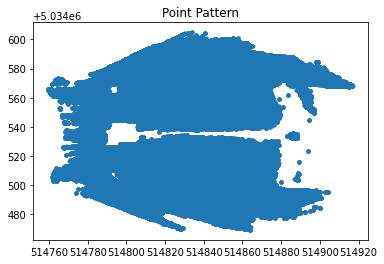

In [ ]:
pp.plot()

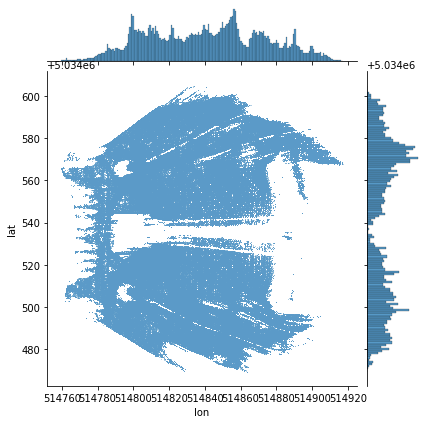

In [ ]:
import seaborn
seaborn.jointplot(x="lon", y="lat", data=df_geopandas, s=0.5);

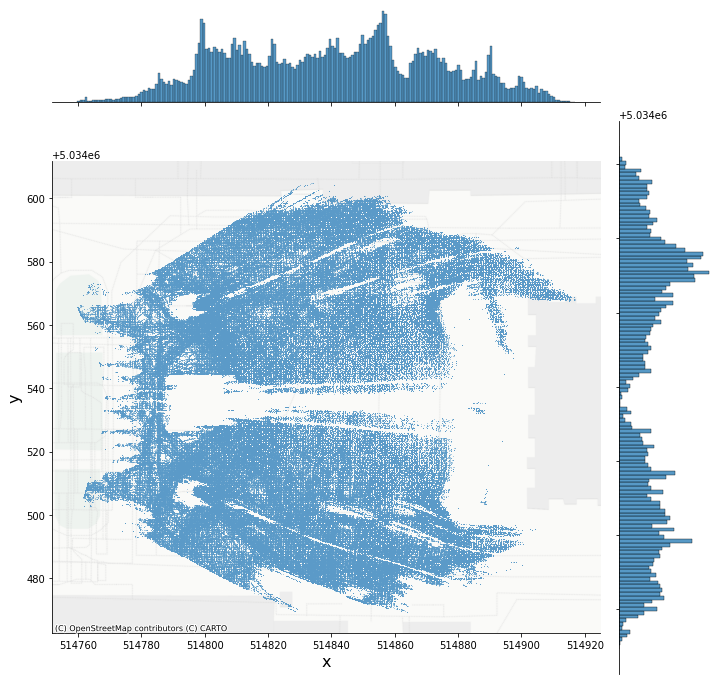

In [ ]:
import seaborn
joint_axes = seaborn.jointplot(
     x="lon", y="lat", data=df_geopandas, s=0.5, height=10
 )
joint_axes.set_axis_labels('x', 'y', fontsize=16)
contextily.add_basemap( 
     joint_axes.ax_joint,
     zoom = 20,
     crs="epsg:32632",
     source=contextily.providers.CartoDB.PositronNoLabels,
 );
# https://dlab.berkeley.edu/news/adding-basemaps-python-contextily

In [ ]:
import seaborn
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
# fig = plt.figure(figsize=(12, 12))


import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (12,12))


joint_axes = seaborn.jointplot(
     x="lon", y="lat", data=df_geopandas, s=0.5, height=10
 )
joint_axes.set_axis_labels('x', 'y', fontsize=16)
contextily.add_basemap( 
     joint_axes.ax_joint,
     zoom = 20,
     crs="epsg:32632",
     source=contextily.providers.CartoDB.PositronNoLabels,
 );

joint_axes.fig.suptitle("Pedestrian Detections Distribution (18.00 - 18.30)", fontsize=25, y=1.03)

# plt.title('Occupancy', fontsize=25)
plt.xlabel('x', fontsize=25)
plt.ylabel('y', fontsize=25)

# Get the axes object
ax = plt.gca()

# Set the tick font size
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=15)

plt.show()
# https://dlab.berkeley.edu/news/adding-basemaps-python-contextily

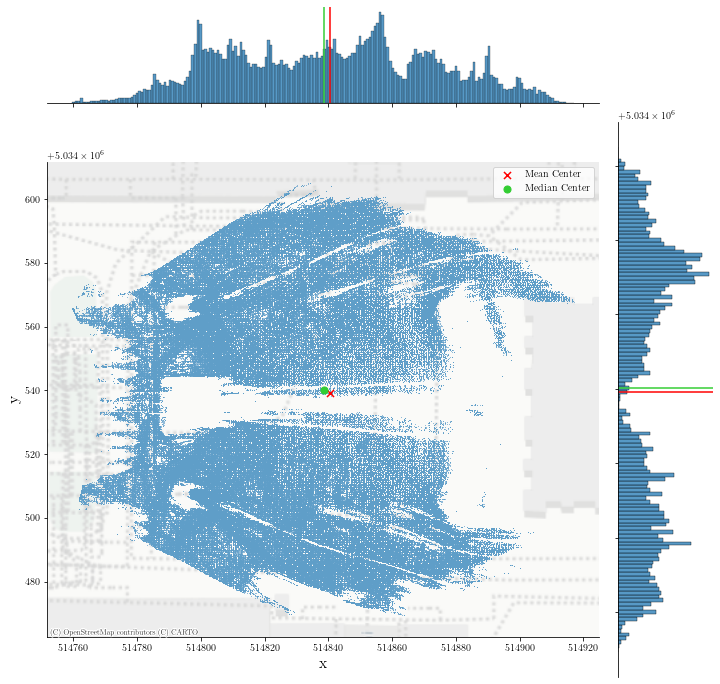

In [ ]:
# # scatter plot senza mean_center e med_center
# joint_axes = seaborn.jointplot(
#     x="lon", y="lat", data=df_geopandas, s=0.5, height=10
# )
# joint_axes.set_axis_labels('x', 'y', fontsize=16)
# contextily.add_basemap( 
#     joint_axes.ax_joint,
#     zoom = 20,
#     crs="epsg:32632",
#     source=contextily.providers.CartoDB.PositronNoLabels,
# );
# # https://dlab.berkeley.edu/news/adding-basemaps-python-contextily


import seaborn
# scatter plot con mean_center e med_center
mean_center = centrography.mean_center(df_geopandas[["lon", "lat"]])
med_center = centrography.euclidean_median(df_geopandas[["lon", "lat"]])

# Generate scatter plot
joint_axes = seaborn.jointplot(
    x="lon", y="lat", data=df_geopandas, s=0.75, height=10
)
joint_axes.set_axis_labels('x', 'y', fontsize=16)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color="red", marker="x", s=50, label="Mean Center"
)

joint_axes.ax_marg_x.axvline(mean_center[0], color="red")
joint_axes.ax_marg_y.axhline(mean_center[1], color="red")
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center,
    color="limegreen",
    marker="o",
    s=50,
    label="Median Center"
)
joint_axes.ax_marg_x.axvline(med_center[0], color="limegreen")
joint_axes.ax_marg_y.axhline(med_center[1], color="limegreen")
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, source=contextily.providers.CartoDB.Positron,
    zoom = 18,
    crs="epsg:32632"
)
# Clean axes
plt.show()


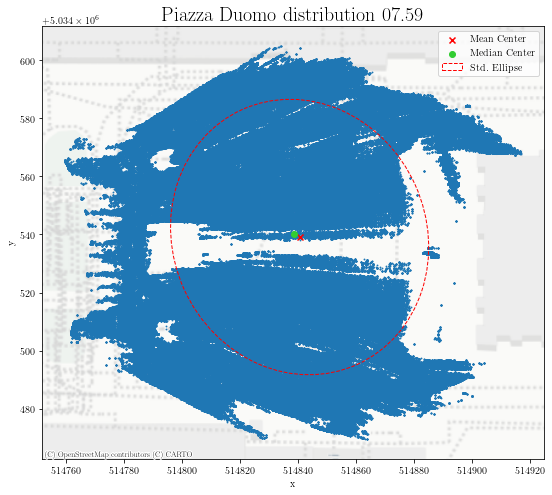

In [ ]:
major, minor, rotation = centrography.ellipse(df_geopandas[["lon", "lat"]])
# https://pysal.org/notebooks/explore/pointpats/centrography.html

from matplotlib.patches import Ellipse
import numpy

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot photograph points
ax.scatter(df_geopandas["lon"], df_geopandas["lat"], s=0.75)
ax.scatter(*mean_center, color="red", marker="x", label="Mean Center")
ax.scatter(
    *med_center, color="limegreen", marker="o", label="Median Center"
)

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(
    xy=mean_center,  # center the ellipse on our mean center
    width=major * 2,  # centrography.ellipse only gives half the axis
    height=minor * 2,
    angle=numpy.rad2deg(
        rotation
    ),  # Angles for this are in degrees, not radians
    facecolor="none",
    edgecolor="red",
    linestyle="--",
    label="Std. Ellipse",
)
ax.add_patch(ellipse)

ax.legend()
# Display
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron,
    zoom = 18,
    crs="epsg:32632"
)
plt.xlabel("x")
plt.ylabel("y")
plt.title('Piazza Duomo distribution 07.59', fontsize=20)
plt.show()

# Density based analysis

## Global: density calculation

In [ ]:
# area piazza duomo da google maps 130*105

# global density = the ratio of the observed number of points, n , to the study region’s surface area, a

# detections / area considerata
# dove #detections dovrebbe essere una media nei vari frame del numero di pedoni identificati
# si avrà cosi una densità globale media

# riprendendo il codice del primo notebook
import pandas as pd
count_ped_frame = pd.DataFrame({'frame': df_geopandas['frame'].unique()})
count_ped_frame['count'] = list(df_geopandas.groupby('frame')['id'].nunique())

num_detections = int(count_ped_frame['count'].mean())  # valore medio per ciascun frame

num_detections/(130*105)
# bisogna considerare che questo valore non è corretto al 100% perchè abbiamo una striscia della piazza in cui non abbiamo detection


0.006153846153846154

## Local: Quadratic analysis

In [ ]:
# !pip install pysal
# import numpy
# import pandas
# import geopandas
# import pysal
# import seaborn
# import contextily
# import matplotlib.pyplot as plt
# from sklearn.cluster import DBSCAN

In [ ]:
from pointpats import (
    distance_statistics,
    QStatistic,
    random,
    PointPattern
)

In [ ]:
pp_df_geopandas = PointPattern(df_geopandas[["lon", "lat"]].values)
pp_df_geopandas.summary()

Point Pattern
2351050 points
Bounding rectangle [(514759.7093981796,5034469.378321334), (514917.04141942743,5034604.941132095)]
Area of window: 21328.37102304399
Intensity estimate for window: 110.23110942039762
               x             y
0  514785.436647  5.034541e+06
1  514803.841525  5.034561e+06
2  514828.381362  5.034566e+06
3  514806.216348  5.034556e+06
4  514787.613568  5.034505e+06


/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


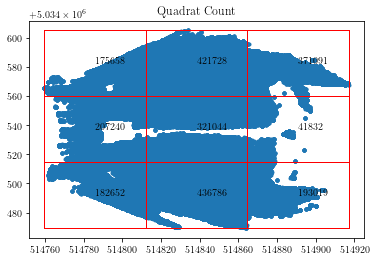

In [ ]:
# si considerano tutte le detection di tutti i frame

# coordinates = df_geopandas[["lon", "lat"]].values
# fig, ax = plt.subplots(figsize=(12, 12))

qstat = QStatistic(pp_df_geopandas)
qstat.plot()

# qstat.plot(ax=ax)
# plt.title('Quadrat Analysis (18.00 - 18.30)', fontsize=25)
# plt

# The quadrat test finds this to be statistically nonrandom, while our simulating process ensured that within the given study area, the pattern is a complete spatially-random process.
# Thus, quadrat counts can have issues with irregular study areas, and care should be taken to ensure that clustering is not mistakenly identified. One way to interpret the quadrat statistic that reconciles cases like the one above is to think of it as a test that considers both the uniformity of points and the shape of their extent to examine whether the resulting pattern is uniform across a regular grid. In some cases, this is a useful tool; in others this needs to be used with caution.

# non è possibile mettere una mappa sotto

In [ ]:
qstat.chi2 #chi-squared test statistic for the observed point pattern

541392.9732459965

In [ ]:
qstat.df

8

In [ ]:
qstat.chi2_pvalue
# Since the p-value based on the analytical χ2 distribution (degree of freedom = 8) 
# is 1.6943004385440985e-14, much smaller than 0.05. We might determine that the underlying process is not CSR. 

0.0

/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


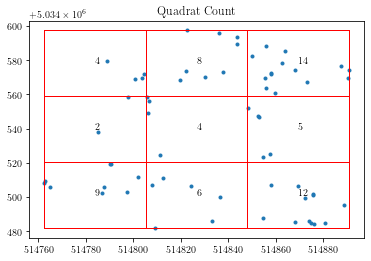

In [ ]:
# si considera un frame in particolare selezionato in maniera arbitraria per capire meglio distribuzione dei punti frame per frame

pp_df_geopandas_frame = PointPattern(df_geopandas[df_geopandas['frame']==40][["lon", "lat"]].values)
qstat = QStatistic(pp_df_geopandas_frame)
qstat.plot()

# non è possibile mettere una mappa sotto

In [ ]:
qstat.chi2_pvalue

# Since the p-value based on the analytical χ2 distribution (degree of freedom = 8) 
# is 1.6943004385440985e-14, much smaller than 0.05. We might determine that the underlying process is not CSR. 

0.022428911757690167

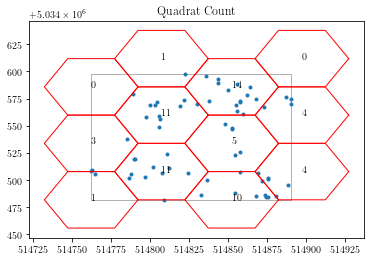

In [ ]:
import pointpats.quadrat_statistics as qs
q_r = qs.QStatistic(pp_df_geopandas_frame,shape= "hexagon",lh = 30)
q_r.plot()

In [ ]:
q_r.chi2_pvalue

7.309688785530452e-07

 ## Local: Density with Hex-binning

In [ ]:
# potrebbe essere interessante mostrarlo

## Heatmap con Folium

In [ ]:
!pip install folium
import folium
from folium import plugins

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import seaborn

In [ ]:
x = df_geopandas[['lon', 'lat']]
from pyproj import Proj, transform

inProj = Proj(init='epsg:32632')
outProj = Proj(init='epsg:4326')


x1,y1 = x['lon'], x['lat']
x2,y2 = transform(inProj,outProj,x1,y1)

x_new_col = {'lon': y2, 'lat': x2}
x_new = pd.DataFrame(data=x_new_col)
x_new



# m = folium.Map(location=[514825,5034535], zoom_start=0, crs = 'epsg:32632')
m = folium.Map(location=[45.46423, 9.18975], zoom_start=50)

# convert to (n, 2) nd-array format for heatmap
stationArr = x_new[0:130000].values

# # plot heatmap
m.add_child(plugins.HeatMap(stationArr,
                            radius = 12,
                            blur = 25,
                            overlay = True,
                            min_opacity = 1))
m

# visualizzando la mappa senza heatmap si vedono bene le uscite della metro

/usr/local/lib/python3.8/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.8/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
<ipython-input-43-12cc21e382ea>:9: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x2,y2 = transform(inProj,outProj,x1,y1)


## Local: Heatmap KDE

In [ ]:
# funziona con un subset di punti

# import seaborn as sns

# # Setup figure and axis
# f, ax = plt.subplots(1, figsize=(12, 12))
# # Add KDE layer that displays probability surface
# sns.kdeplot(
#     df_geopandas["lon"], 
#     df_geopandas["lat"], 
#     n_levels=50, 
#     shade=True,
#     alpha=0.25,
#     cmap="viridis"
# )
# # Remove axis
# ax.set_axis_off()
# # Add basemap
# contextily.add_basemap(
#     ax, 
#     crs="epsg:32632",
#     source=contextily.providers.CartoDB.DarkMatterNoLabels
# )
# # Add title of the map
# # Draw map
# plt.show()



# senza mappa di sfondo
# sns.kdeplot(
#     df_geopandas_no_outliers["lon"], 
#     df_geopandas_no_outliers["lat"], 
#     n_levels=50, 
#     shade=True, 
#     cmap='BuPu'
# );


# Distance based analysis

## Ripley's k function

In [ ]:
# coordinates = df_geopandas[["lon", "lat"]].values  # richiede molte risorse

# import numpy
# g_test = distance_statistics.g_test(
#     coordinates, support=40, keep_simulations=True
# )

# f, ax = plt.subplots(
#     1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
# )


# # plot all the simulations with very fine lines
# ax[0].plot(
#     g_test.support, g_test.simulations.T, color="k", alpha=0.01
# )
# # and show the average of simulations
# ax[0].plot(
#     g_test.support,
#     numpy.median(g_test.simulations, axis=0),
#     color="cyan",
#     label="median simulation",
# )


# # and the observed pattern's G function
# ax[0].plot(
#     g_test.support, g_test.statistic, label="observed", color="red"
# )

# # clean up labels and axes
# ax[0].set_xlabel("distance")
# ax[0].set_ylabel("% of nearest neighbor\ndistances shorter")
# ax[0].legend()
# ax[0].set_xlim(0, 10)
# ax[0].set_title(r"Ripley's $G(d)$ function")

# # plot the pattern itself on the next frame
# ax[1].scatter(*coordinates.T)

# # and clean up labels and axes there, too
# ax[1].set_xticks([])
# ax[1].set_yticks([])
# ax[1].set_xticklabels([])
# ax[1].set_yticklabels([])
# ax[1].set_title("Pattern")
# f.tight_layout()
# plt.show()
# In this plot, we see that the red empirical function rises much faster than simulated 
# completely spatially random patterns. This means that the observed pattern of this user’s 
# Flickr photographs are closer to their nearest neighbors than would be expected from a 
# completely spatially random pattern. The pattern is clustered.


# f_test = distance_statistics.f_test(
#     coordinates, support=40, keep_simulations=True
# )

# f, ax = plt.subplots(
#     1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
# )

# # plot all the simulations with very fine lines
# ax[0].plot(
#     f_test.support, f_test.simulations.T, color="k", alpha=0.01
# )
# # and show the average of simulations
# ax[0].plot(
#     f_test.support,
#     numpy.median(f_test.simulations, axis=0),
#     color="cyan",
#     label="median simulation",
# )


# # and the observed pattern's F function
# ax[0].plot(
#     f_test.support, f_test.statistic, label="observed", color="red"
# )

# # clean up labels and axes
# ax[0].set_xlabel("distance")
# ax[0].set_ylabel("% of nearest point in pattern\ndistances shorter")
# ax[0].legend()
# ax[0].set_xlim(0, 10)
# ax[0].set_title(r"Ripley's $F(d)$ function")

# # plot the pattern itself on the next frame
# ax[1].scatter(*coordinates.T)

# # and clean up labels and axes there, too
# ax[1].set_xticks([])
# ax[1].set_yticks([])
# ax[1].set_xticklabels([])
# ax[1].set_yticklabels([])
# ax[1].set_title("Pattern")
# f.tight_layout()
# plt.show()
# We can use similar tooling to investigate the  function, since it is so 
# mathematically similar to the  function. This is implemented identically using the f_test 
# function in pointpats. Since the  function estimated for the observed pattern increases much 
# more slowly than the  functions for the simulated patterns, we can be confident that there are many gaps in our pattern; i.e. the pattern is clustered.

In [ ]:
!pip freeze

In [ ]:
# !pip freeze > requirements.txt